In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import time
from datetime import timedelta
from IPython import display

plt.style.use('dark_background')

In [2]:
EPOCHS = 4
START_EPOCH_FROM = 2
BATCH_SIZE = 10
SEED_FILE_NAME = 'seed.npy'
noise_dim = 100
num_examples_to_generate = 25

if os.path.exists('seed.npy'):
  with open(SEED_FILE_NAME, 'rb') as seed_file:
    seed = np.load(seed_file)
else:
  with open(SEED_FILE_NAME, 'wb') as seed_file:
    seed = tf.random.normal([num_examples_to_generate, noise_dim])
    np.save(seed_file, seed)

In [3]:
img_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=lambda x: (x / 127.5) - 1)

img_generator = img_datagen.flow_from_directory(
  directory='data',
  target_size=(100, 100),
  batch_size=10)

Found 49887 images belonging to 1 classes.


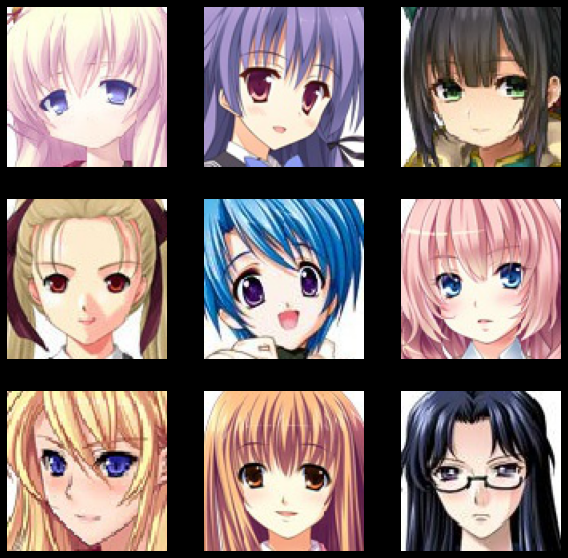

In [4]:
plt.figure(figsize=(10, 10))
images, label = img_generator.next()

for i in range(9):
  plt.subplot(3, 3, i + 1)
    
  plt.imshow(images[i, :, :, :] / 2 + 0.5)
  plt.axis('off')

plt.show()

In [5]:
class GAN():
  def __init__(self, noise_dim, input_shape):
    super().__init__()
    self.noise_dim = noise_dim
    self.input_shape = input_shape

    self.generator = tf.keras.Sequential(
      [
        tf.keras.layers.Dense(11*11*256, use_bias=False, input_shape=(self.noise_dim,)),
        tf.keras.layers.Reshape((11, 11, 256)),
        tf.keras.layers.Conv2DTranspose(256, (5, 5), (2, 2)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Conv2DTranspose(128, (5, 5), (2, 2), padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Conv2DTranspose(128, (5, 5), (2, 2), padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Conv2DTranspose(3, (5, 5), activation=tf.nn.tanh, padding='same'),
      ], name='Generator'
    )

    self.discriminator = tf.keras.Sequential(
      [
        tf.keras.layers.Conv2D(128, (5, 5), (2, 2), input_shape=input_shape, activation=tf.nn.leaky_relu),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(128, (5, 5), (2, 2), activation=tf.nn.leaky_relu),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv2D(128, (5, 5), (2, 2), activation=tf.nn.leaky_relu),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1),
      ], name='Discriminator'
    )

  def save(self, fname=None):
    if fname:
      self.discriminator.save_weights(f'{fname}-discriminator-weights.h5')
      self.generator.save_weights(f'{fname}-generator-weights.h5')
    else:
      self.discriminator.save_weights('anime-faces-discriminator-weights.h5')
      self.generator.save_weights('anime-faces-generator-weights.h5')
  
  def load(self, fname=None):
    if fname:
      self.discriminator.load_weights(f'{fname}-discriminator-weights.h5')
      self.generator.load_weights(f'{fname}-generator-weights.h5')
    else:
      self.discriminator.load_weights('anime-faces-discriminator-weights.h5')
      self.generator.load_weights('anime-faces-generator-weights.h5')

  def generate(self, epoch, seed=None, save_img=False, folder='images', grid_side=5):
    if save_img and not os.path.exists(folder): 
      os.mkdir(folder)
    
    if seed is None:
      seed = tf.random.normal([grid_side ** 2, noise_dim])

    predictions = self.generator(seed, training=False)
    

    plt.figure(figsize=(15, 15))

    for i in range(predictions.shape[0]):
      plt.subplot(grid_side, grid_side, i+1)
      plt.imshow(predictions[i, :, :, :] / 2 + 0.5)
      plt.axis('off')

    if save_img: 
      plt.savefig(f'{folder}/{folder}_{epoch:04d}.png')
    
    plt.show()

In [6]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [7]:
@tf.function
def train_step(model, images):
  noise = tf.random.normal([BATCH_SIZE, noise_dim])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = model.generator(noise, training=True)

    real_output = model.discriminator(images, training=True)
    fake_output = model.discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, model.generator.trainable_variables)
  gradients_of_discriminator = disc_tape.gradient(disc_loss, model.discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, model.generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, model.discriminator.trainable_variables))

  return gen_loss, disc_loss

In [8]:
def train(dataset, epochs, start_from=0, callback=None):
  model.generate(start_from, seed)
  
  time_elapsed = 0
  generator_losses = []
  discrimiator_losses = []

  for epoch in range(start_from + 1, epochs + 1):
    start_time = time.perf_counter()

    avg_gl = 0
    avg_dl = 0

    for i in range(1, 4989):
      image_batch, _ = dataset.next()
      gl, dl = train_step(model, image_batch)

      avg_gl = 0.99 * avg_gl + 0.01 * gl   
      avg_dl = 0.99 * avg_dl + 0.01 * dl   

      # Display the generated images every 100th batch of a single epoch
      if i % 100 == 0:
        display.clear_output(wait=True)
        model.generate(0, seed)
        generator_losses.append(avg_gl)
        discrimiator_losses.append(avg_dl)
      
      print(f'\repoch: {epoch}/{epochs}\tbatch: {i:>4}/4988\tgl: {avg_gl:.4f}' + \
            f'\tdl: {avg_dl: .4f}\tTime Elapsed: {timedelta(seconds=time_elapsed)}', end='')
    
    time_elapsed = time.perf_counter() - start_time

    if callback is not None:
      callback(epoch, model, np.array(generator_losses[:49]).reshape((-1, 1)), np.array(discrimiator_losses[:49]).reshape((-1, 1)))

    display.clear_output(wait=True)
    model.generate(epoch, seed, epoch % 1 == 0)
    print(f'gl: {avg_gl:.4f}\tdl: {avg_dl: .4f}\tTime Elapsed: {timedelta(seconds=time_elapsed)}', end='')
  
  return np.array(generator_losses).reshape((-1, 1)), np.array(discrimiator_losses).reshape((-1, 1))

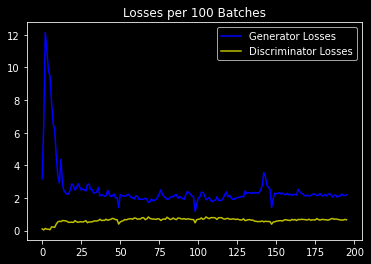

In [11]:
def callback(epoch, model, gls, dls):
  losses_fname = 'losses.npy'
  res = np.append(gls, dls, axis=1)

  if os.path.exists(losses_fname):
    with open(losses_fname, 'rb') as losses_file:
      temp = np.load(losses_file)
      losses = np.append(temp, res, axis=0)
  else: 
    losses = res

  with open(losses_fname, 'wb') as losses_file:
    np.save(losses_file, losses)

  model.save()

In [9]:
model = GAN(noise_dim, (100, 100, 3))

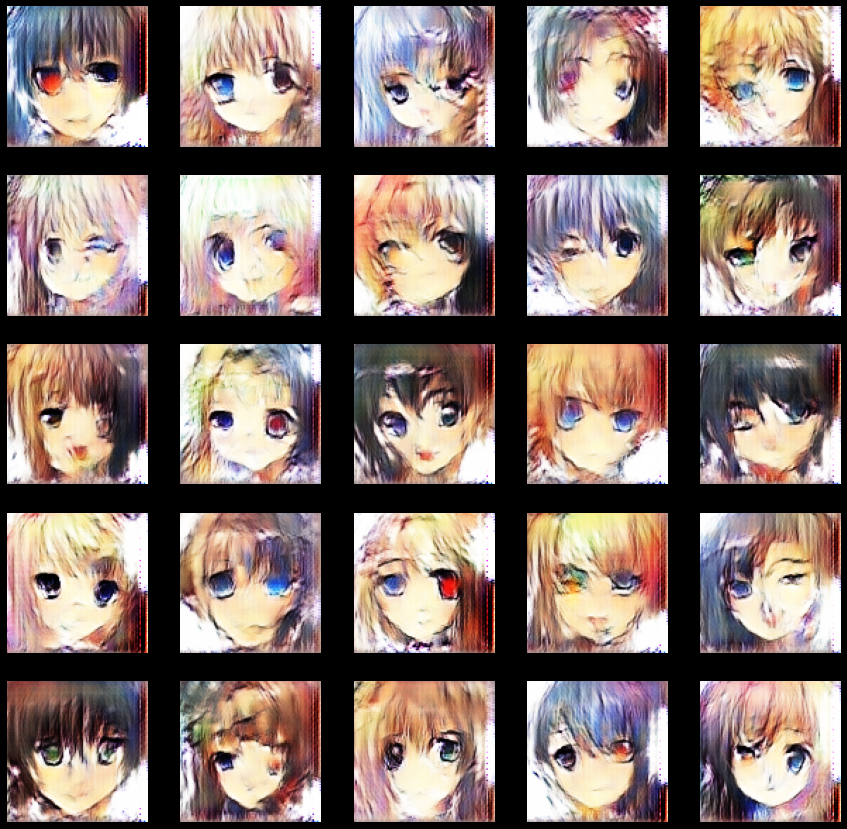

gl: 2.0567	dl:  0.6825	Time Elapsed: 0:11:27.465745

In [10]:
if START_EPOCH_FROM > 0: model.load()

gls, dls = train(img_generator, EPOCHS, START_EPOCH_FROM, callback=callback)

In [12]:
with open('losses.npy', 'rb') as losses_file:
  losses = np.load(losses_file)

plt.plot(losses[:, 0], color='b', label='Generator Losses')
plt.plot(losses[:, 1], color='y', label='Discriminator Losses')

plt.legend()
plt.title('Losses per 100 Batches')

plt.show()

In [13]:
model.save()

In [14]:
!python images_to_gif.py images anime-faces

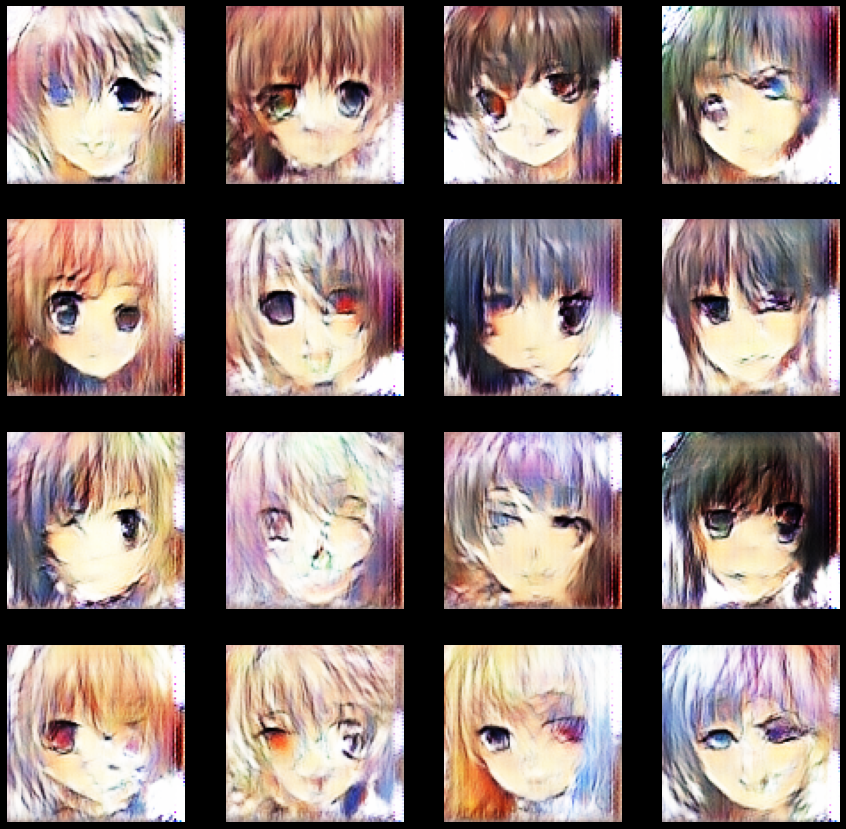

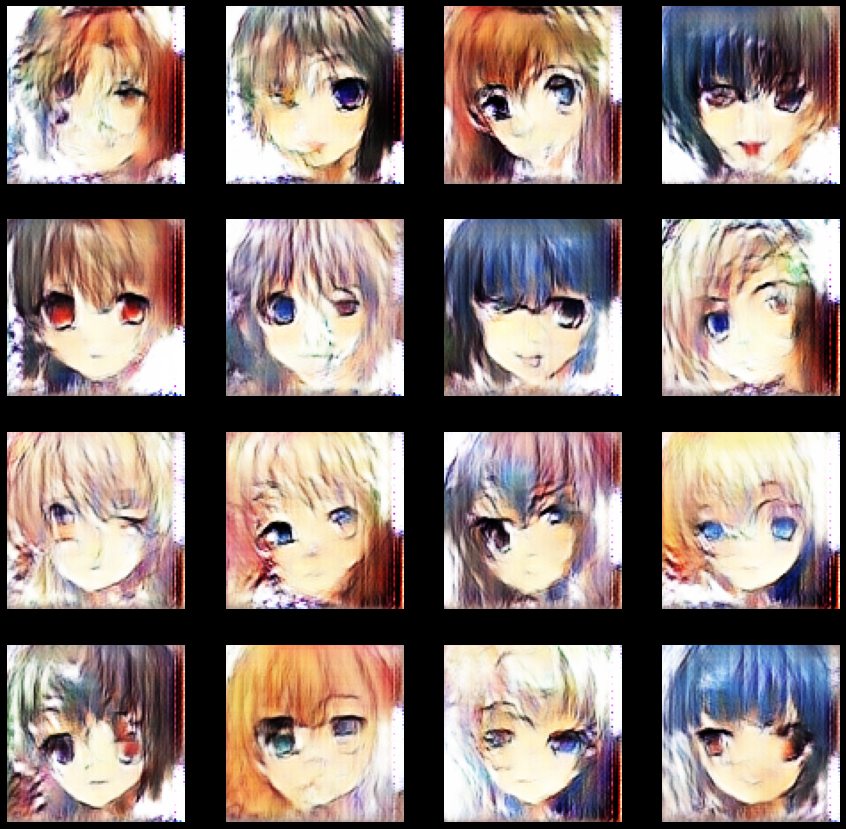

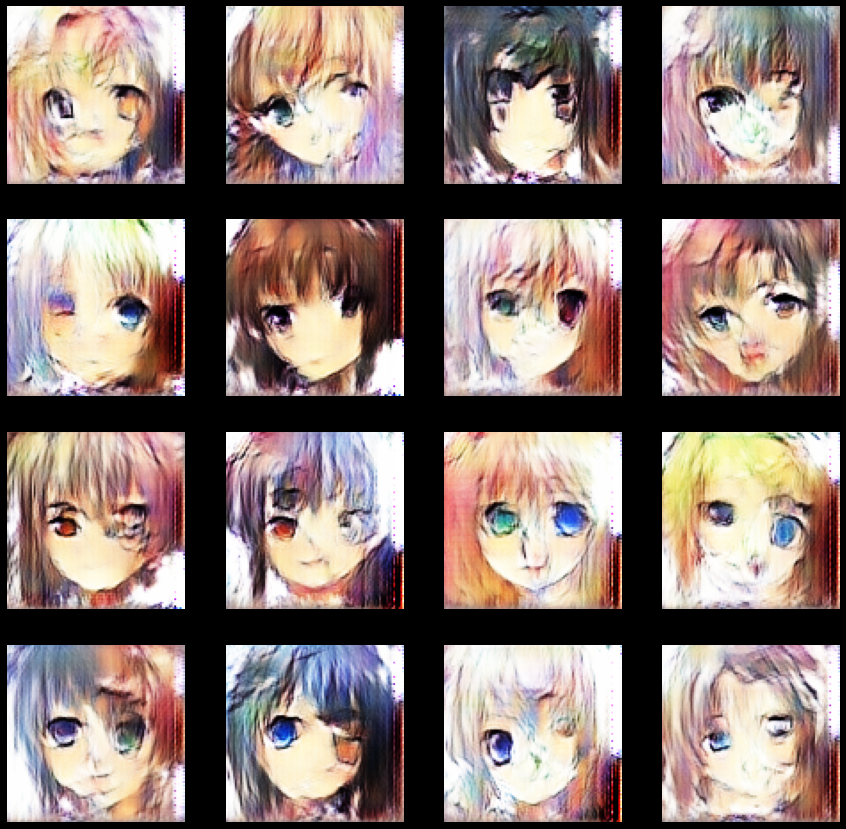

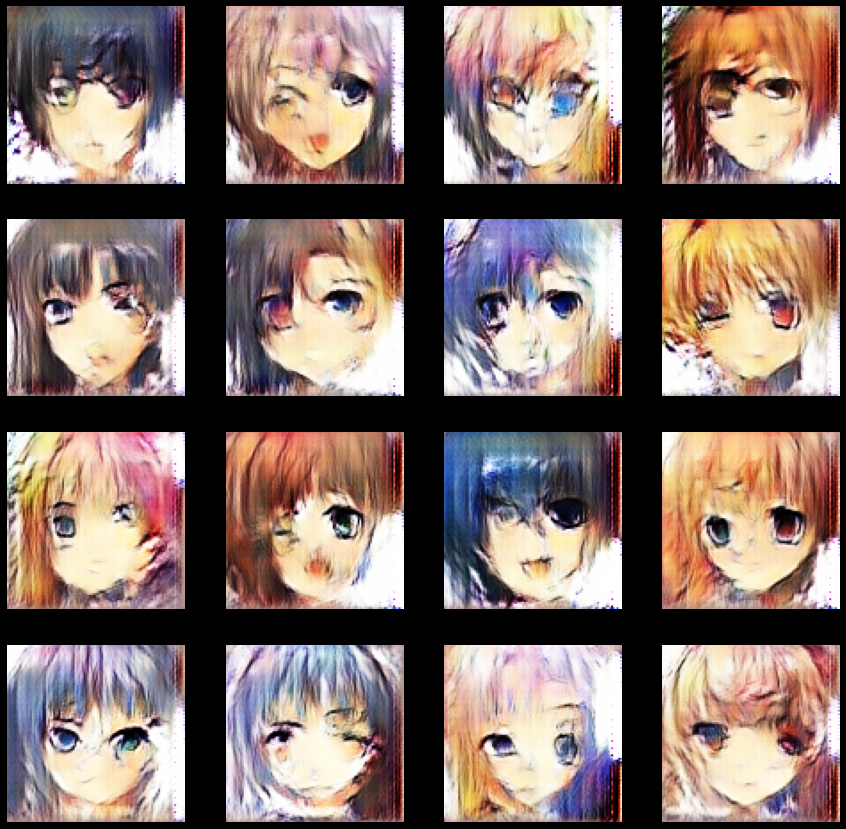

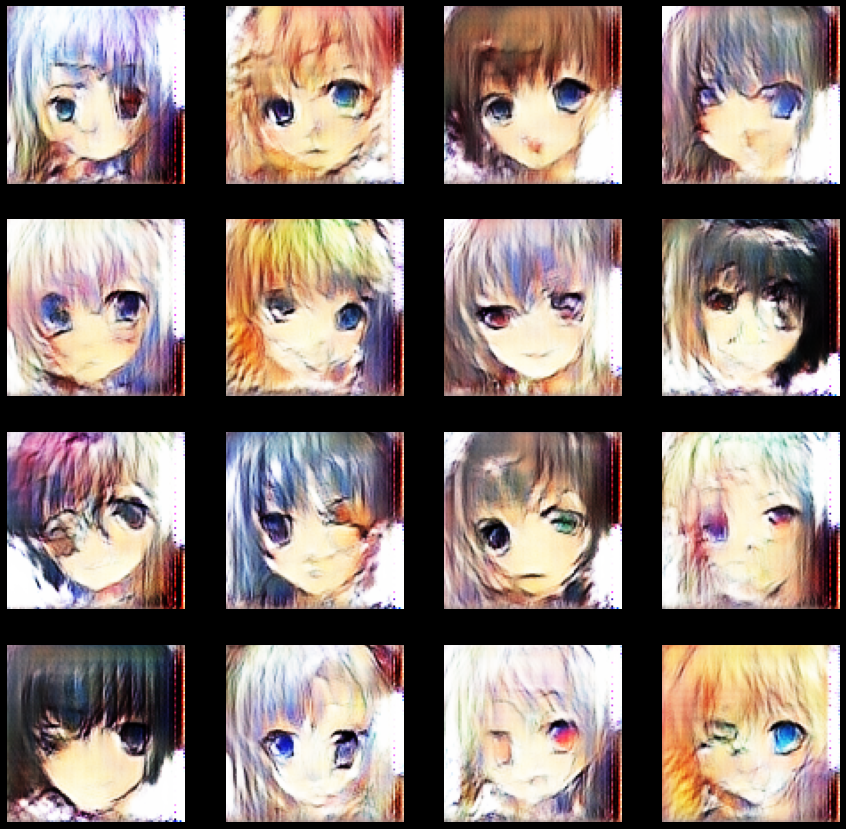

In [15]:
num_samples = 5
grid_size = 4

for i in range(num_samples):
  model.generate(i, grid_side=grid_size, 
                                folder='samples', 
                                save_img=True)